In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor

In [ ]:
#delete
from google.colab import files
files.upload()

Saving rainfall_normal1.csv to rainfall_normal1.csv


{'rainfall_normal1.csv': b'longitude,latitude,time,u10,v10,t2m,sp,tp\n73.7300033569336,18.600000381469727,2016-01-01 00:00:00,0.26166969120208233,0.4875711614696495,0.19422196730298003,0.8726605659739188,0.0\n73.7300033569336,18.600000381469727,2016-01-01 01:00:00,0.2496604762711662,0.4695039278508286,0.16657195148779863,0.888773535270023,0.0\n73.7300033569336,18.600000381469727,2016-01-01 02:00:00,0.23726977613750538,0.47902584816098354,0.1370297209964593,0.9074359239355116,0.0\n73.7300033569336,18.600000381469727,2016-01-01 03:00:00,0.26766667346337547,0.4777287928217226,0.2360030700251364,0.9286002856176492,0.0\n73.7300033569336,18.600000381469727,2016-01-01 04:00:00,0.2461660445334423,0.4826270880558196,0.42674635714867676,0.9397407831936556,0.0\n73.7300033569336,18.600000381469727,2016-01-01 05:00:00,0.21560130834300695,0.5231868096400429,0.5092854407653036,0.9410829042805077,0.0\n73.7300033569336,18.600000381469727,2016-01-01 06:00:00,0.20548426198640612,0.5467474515337393,0.5796

-------------------------------------------------------------------

In [ ]:
norm_data = pd.read_csv('rainfall_normal1.csv')
norm_data

,longitude,latitude,time,u10,v10,t2m,sp,tp
0,73.730003,18.6,2016-01-01 00:00:00,0.261670,0.487571,0.194222,0.872661,0.000000
1,73.730003,18.6,2016-01-01 01:00:00,0.249660,0.469504,0.166572,0.888774,0.000000
2,73.730003,18.6,2016-01-01 02:00:00,0.237270,0.479026,0.137030,0.907436,0.000000
3,73.730003,18.6,2016-01-01 03:00:00,0.267667,0.477729,0.236003,0.928600,0.000000
4,73.730003,18.6,2016-01-01 04:00:00,0.246166,0.482627,0.426746,0.939741,0.000000
...,...,...,...,...,...,...,...,...
79051,73.930000,18.4,2016-12-31 19:00:00,0.477027,0.422413,0.185189,0.268797,0.000015
79052,73.930000,18.4,2016-12-31 20:00:00,0.450216,0.421833,0.206689,0.264845,0.000015
79053,73.930000,18.4,2016-12-31 21:00:00,0.423649,0.426472,0.205789,0.253093,0.000015
79054,73.930000,18.4,2016-12-31 22:00:00,0.405078,0.438008,0.213861,0.243908,0.000015


In [ ]:
norm_data

,longitude,latitude,time,u10,v10,t2m,sp,tp
0,73.730003,18.6,2016-01-01 00:00:00,0.261670,0.487571,0.194222,0.872661,0.000000
1,73.730003,18.6,2016-01-01 01:00:00,0.249660,0.469504,0.166572,0.888774,0.000000
2,73.730003,18.6,2016-01-01 02:00:00,0.237270,0.479026,0.137030,0.907436,0.000000
3,73.730003,18.6,2016-01-01 03:00:00,0.267667,0.477729,0.236003,0.928600,0.000000
4,73.730003,18.6,2016-01-01 04:00:00,0.246166,0.482627,0.426746,0.939741,0.000000
...,...,...,...,...,...,...,...,...
79051,73.930000,18.4,2016-12-31 19:00:00,0.477027,0.422413,0.185189,0.268797,0.000015
79052,73.930000,18.4,2016-12-31 20:00:00,0.450216,0.421833,0.206689,0.264845,0.000015
79053,73.930000,18.4,2016-12-31 21:00:00,0.423649,0.426472,0.205789,0.253093,0.000015
79054,73.930000,18.4,2016-12-31 22:00:00,0.405078,0.438008,0.213861,0.243908,0.000015


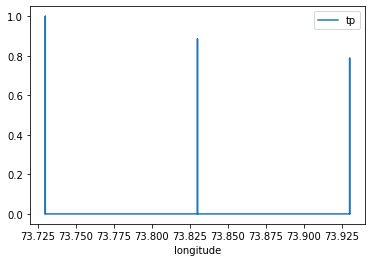

In [ ]:
norm_data.plot(x='longitude', y = 'tp')

In [ ]:
norm_data.isnull().sum()

longitude    0
latitude     0
time         0
u10          0
v10          0
t2m          0
sp           0
tp           0
dtype: int64

In [ ]:
norm_data.shape

(79056, 8)

In [ ]:
d1 = norm_data.drop(['time'],axis=1)
d1

,longitude,latitude,u10,v10,t2m,sp,tp
0,73.730003,18.6,0.261670,0.487571,0.194222,0.872661,0.000000
1,73.730003,18.6,0.249660,0.469504,0.166572,0.888774,0.000000
2,73.730003,18.6,0.237270,0.479026,0.137030,0.907436,0.000000
3,73.730003,18.6,0.267667,0.477729,0.236003,0.928600,0.000000
4,73.730003,18.6,0.246166,0.482627,0.426746,0.939741,0.000000
...,...,...,...,...,...,...,...
79051,73.930000,18.4,0.477027,0.422413,0.185189,0.268797,0.000015
79052,73.930000,18.4,0.450216,0.421833,0.206689,0.264845,0.000015
79053,73.930000,18.4,0.423649,0.426472,0.205789,0.253093,0.000015
79054,73.930000,18.4,0.405078,0.438008,0.213861,0.243908,0.000015


In [ ]:
#splitting data

x = d1.iloc[:,:-1]
print(x)

y = d1.iloc[:,-1:]
print(y)

       longitude  latitude       u10       v10       t2m        sp
0      73.730003      18.6  0.261670  0.487571  0.194222  0.872661
1      73.730003      18.6  0.249660  0.469504  0.166572  0.888774
2      73.730003      18.6  0.237270  0.479026  0.137030  0.907436
3      73.730003      18.6  0.267667  0.477729  0.236003  0.928600
4      73.730003      18.6  0.246166  0.482627  0.426746  0.939741
...          ...       ...       ...       ...       ...       ...
79051  73.930000      18.4  0.477027  0.422413  0.185189  0.268797
79052  73.930000      18.4  0.450216  0.421833  0.206689  0.264845
79053  73.930000      18.4  0.423649  0.426472  0.205789  0.253093
79054  73.930000      18.4  0.405078  0.438008  0.213861  0.243908
79055  73.930000      18.4  0.394839  0.454412  0.214838  0.238399

[79056 rows x 6 columns]
             tp
0      0.000000
1      0.000000
2      0.000000
3      0.000000
4      0.000000
...         ...
79051  0.000015
79052  0.000015
79053  0.000015
79054  0.0

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
scaled = StandardScaler()

In [ ]:
scaled_train = scaled.fit_transform(x)

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(scaled_train, y, test_size=0.35, random_state=42)

In [ ]:
mlp = MLPRegressor(hidden_layer_sizes=(225,), activation="relu", solver="adam", learning_rate="constant", verbose=True, max_iter=400)

In [ ]:
mlp.fit(x_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1599: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Iteration 1, loss = 0.00132684
Iteration 2, loss = 0.00086805
Iteration 3, loss = 0.00082193
Iteration 4, loss = 0.00079929
Iteration 5, loss = 0.00079365
Iteration 6, loss = 0.00077690
Iteration 7, loss = 0.00077117
Iteration 8, loss = 0.00077210
Iteration 9, loss = 0.00075508
Iteration 10, loss = 0.00075354
Iteration 11, loss = 0.00073560
Iteration 12, loss = 0.00073834
Iteration 13, loss = 0.00073336
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.


MLPRegressor(hidden_layer_sizes=(225,), max_iter=400, verbose=True)

In [ ]:
print(mlp.score(x_test, y_test) * 100)

30.655783877628874
